# Load

In [ ]:
import seisviz as sv


In [2]:
import os
import numpy as np

# Uses your own data if it's present at this path; otherwise falls back to a
# synthetic cube so this notebook still runs from a fresh clone with no
# external data. Different exports of this benchmark are prepared with
# different native axis orders - this copy is already inline-major
# ('ixd', a no-op here), but check yours with sv.get_volume_range_info() rather
# than assuming; a copy prepared xline-major would need current_order='xid'.
data_path = "../data/Seismic Challenge/TrainData/"

if os.path.exists(os.path.join(data_path, "train_seismic.npy")):
    volume, geometry = sv.load_seismic_data(
        os.path.join(data_path, "train_seismic.npy"),
        current_order='ixd', return_geometry=True)
    labels = sv.load_seismic_data(os.path.join(data_path, "train_labels.npy"),
                                   current_order='ixd')
else:
    print("No local dataset found at", data_path, "- using a synthetic cube instead.")
    n_inlines, n_xlines, n_depth = 560, 420, 260
    i = np.arange(n_inlines)[:, None, None]
    x = np.arange(n_xlines)[None, :, None]
    d = np.arange(n_depth)[None, None, :]

    dip = 0.05 * i + 0.03 * x
    volume = (np.sin((d - dip) / 7.0) * np.exp(-d / 230.0) * 3.0).astype(np.float32)
    volume += np.random.default_rng(0).normal(0, 0.12, volume.shape).astype(np.float32)
    volume[..., :40] *= 4.0  # a strong shallow event, so amplitudes are not symmetric

    labels = np.zeros(volume.shape, dtype=np.int64)
    labels[(d - dip) > 60] = 1
    labels[(d - dip) > 130] = 2
    labels[(d - dip) > 200] = 5

    geometry = {'domain': 'time'}  # matches load_seismic_data's default

n_inlines, n_xlines, n_depth = volume.shape

# Representative slice indices, derived from the loaded volume's actual
# shape rather than hardcoded, so the same notebook works for any dataset
# size - real or synthetic.
inline_mid = n_inlines // 4
inline_near = min(10, n_inlines - 1)
inline_far = min(int(n_inlines * 0.9), n_inlines - 1)
xline_mid = n_xlines // 4
xline_far = min(int(n_xlines * 0.9), n_xlines - 1)
depth_mid = int(n_depth * 0.75)
depth_far = min(int(n_depth * 0.95), n_depth - 1)

print(sv.get_volume_range_info(volume))

label_dict = {
    'class': {0: 'Class A', 1: 'Class B', 2: 'Class C', 3: 'Class D',
              4: 'Class E', 5: 'Class F'},
    'color': {
        0: 'dodgerblue',
        1: 'darkorange',
        2: 'skyblue',
        3: 'forestgreen',
        4: 'gray',
        5: 'hotpink',
    },
}


{'inline_range': (0, 400), 'xline_range': (0, 700), 'depth_sample_range': (0, 254), 'shape': (401, 701, 255)}


In [3]:
# Already reordered into seisviz's (inline, xline, depth) convention above.
# For a volume already in that order, sv.reorder_volume is a no-op to skip.


# 2D

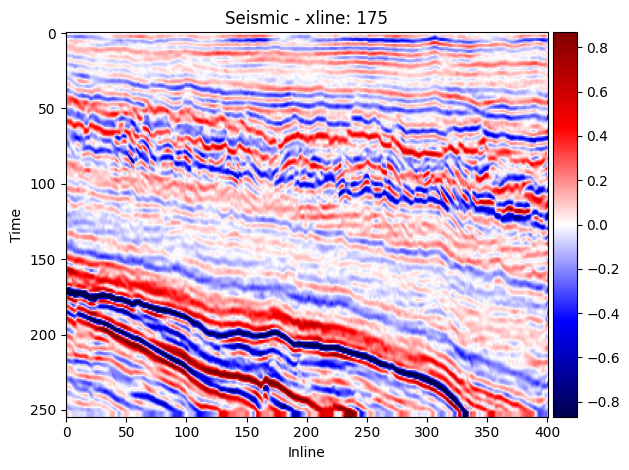

In [4]:
fig, ax = sv.plot_2D_seismic(volume, line_number=xline_mid, line_type='xline', geometry=geometry)

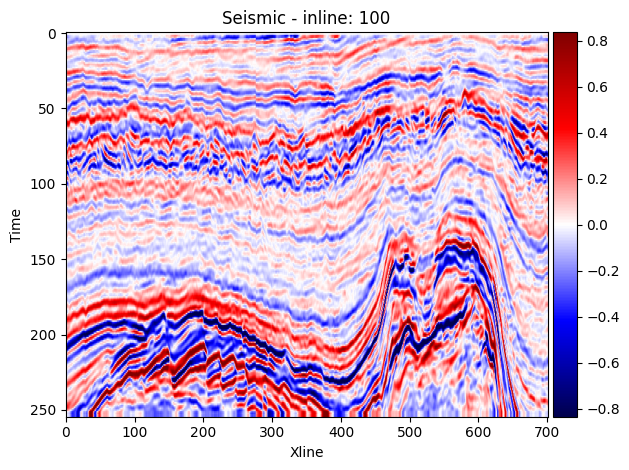

In [5]:
fig, ax = sv.plot_2D_seismic(volume, line_number=inline_mid, line_type='inline', geometry=geometry)

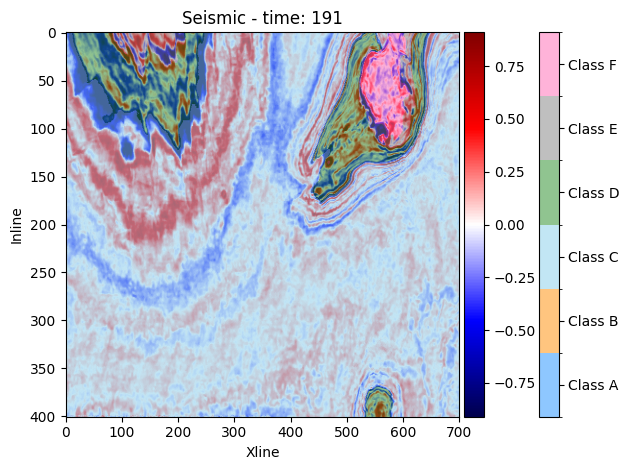

In [6]:
fig, ax = sv.plot_2D_seismic(volume, depth_mid, line_type='depth', label=labels, label_dict=label_dict, geometry=geometry)


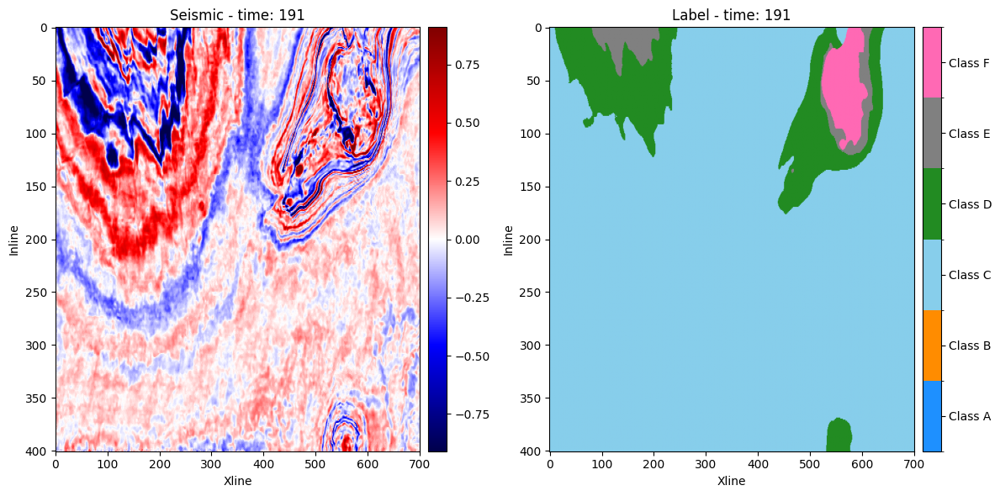

In [7]:
fig, (ax1, ax2) = sv.plot_2D_seismic(volume, depth_mid, line_type='depth', label=labels, label_dict=label_dict, display_mode='side_by_side', geometry=geometry)

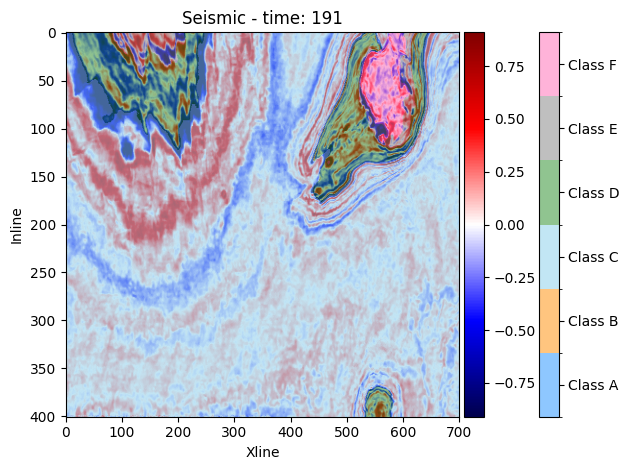

In [8]:
fig, ax = sv.plot_2D_seismic(volume, depth_mid, line_type='depth', label=labels, label_dict=label_dict, geometry=geometry)

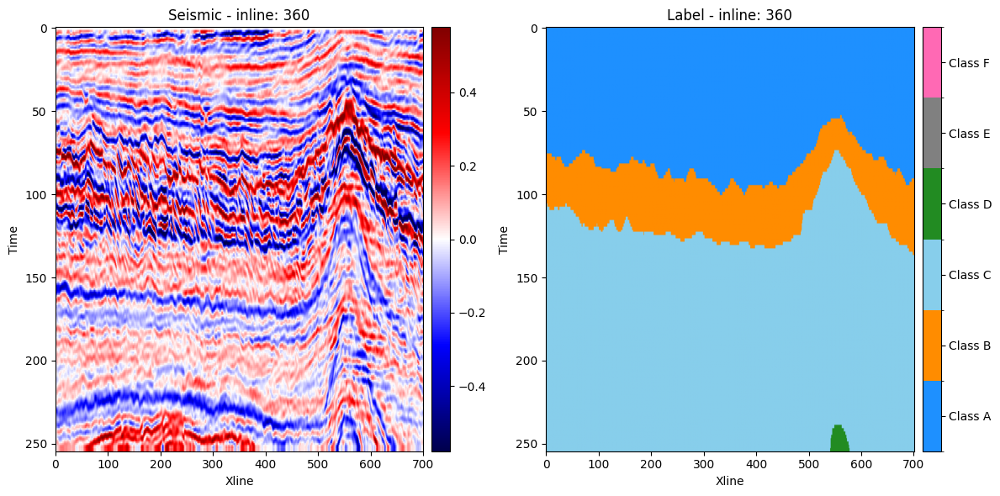

In [9]:
fig, (ax1, ax2) = sv.plot_2D_seismic(volume, inline_far, line_type='inline', label=labels, label_dict=label_dict, display_mode='side_by_side', geometry=geometry)

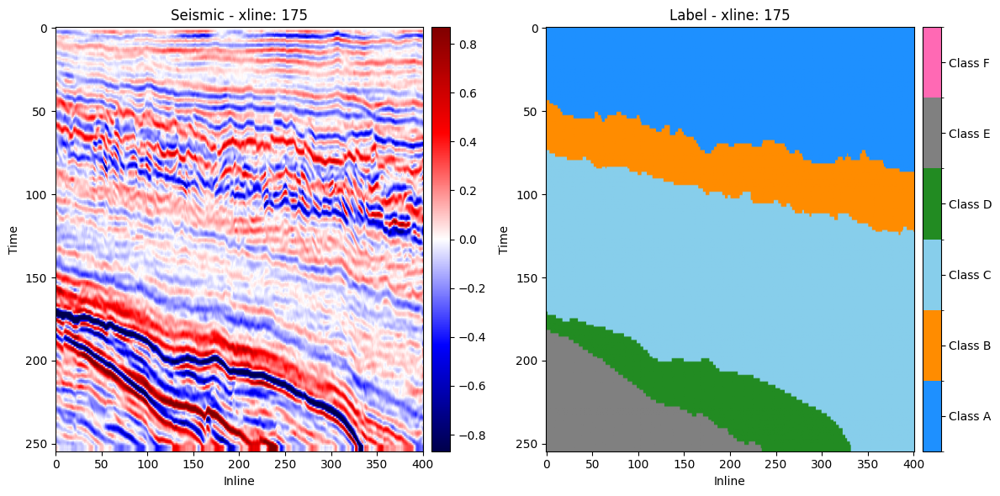

In [10]:
fig, (ax1, ax2) = sv.plot_2D_seismic(volume, xline_mid, line_type='xline', label=labels, label_dict=label_dict, display_mode='side_by_side', geometry=geometry)

Displaying random xline slice: 220


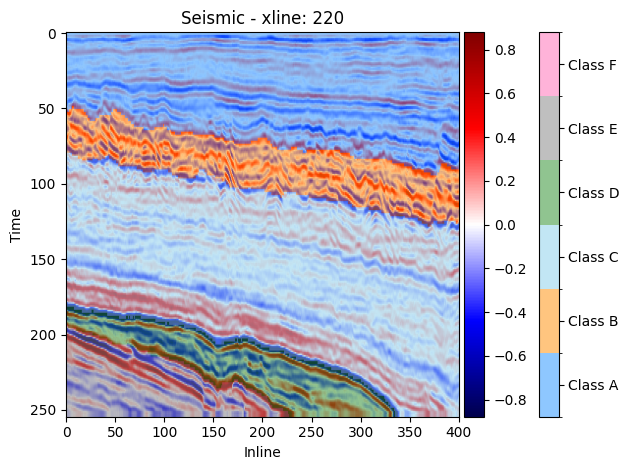

In [11]:
fig, ax = sv.show_random_line(volume, line_type='xline', label=labels, cmap='seismic', label_dict=label_dict, geometry=geometry)

Displaying random xline slice: 633


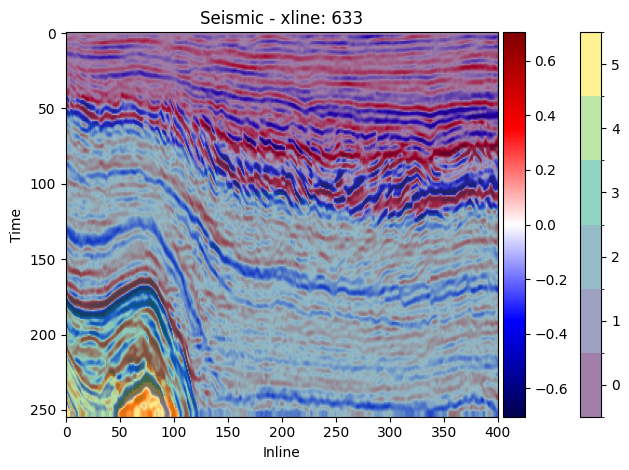

In [12]:
fig, ax = sv.show_random_line(volume, line_type='xline', label=labels, cmap='seismic', geometry=geometry)

Displaying random xline slice: 321


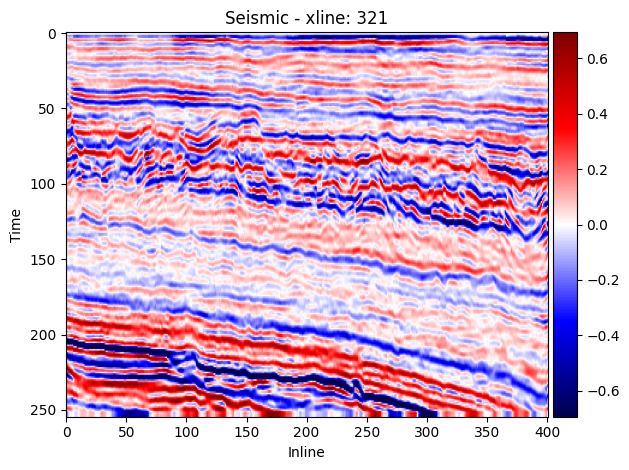

In [13]:
fig, ax = sv.show_random_line(volume, line_type='xline', cmap='seismic', geometry=geometry)

# 3D

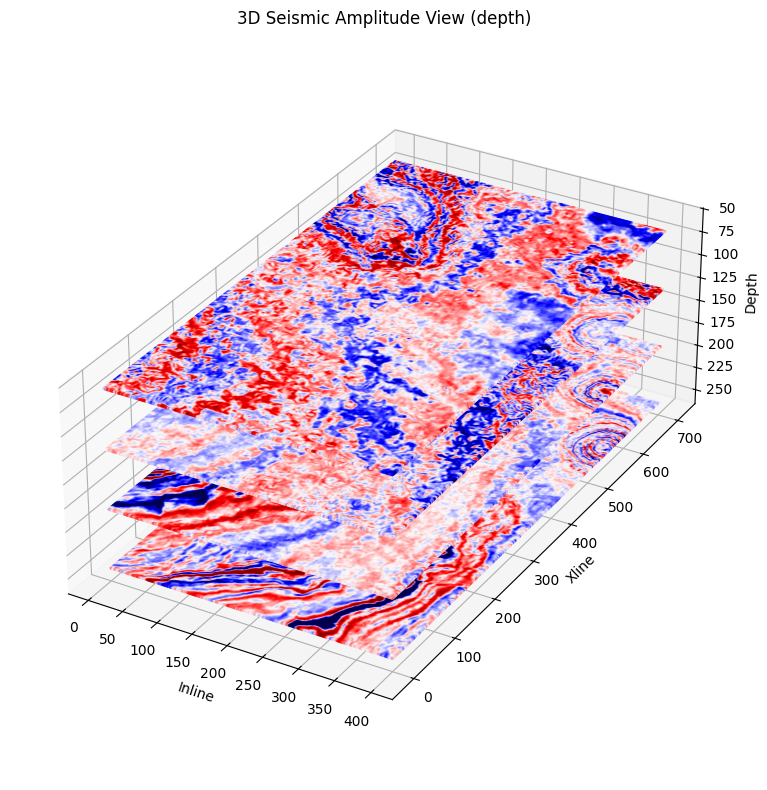

In [14]:
fig, ax = sv.plot_seismic_3d_slices(volume,
                       direction='depth',
                       step=max(n_depth // 4, 1),
                       threshold=0,
                     #   threshold=0.1,
                       start=0,
                    #    cmap='grey'
                       cmap='seismic'

                       )

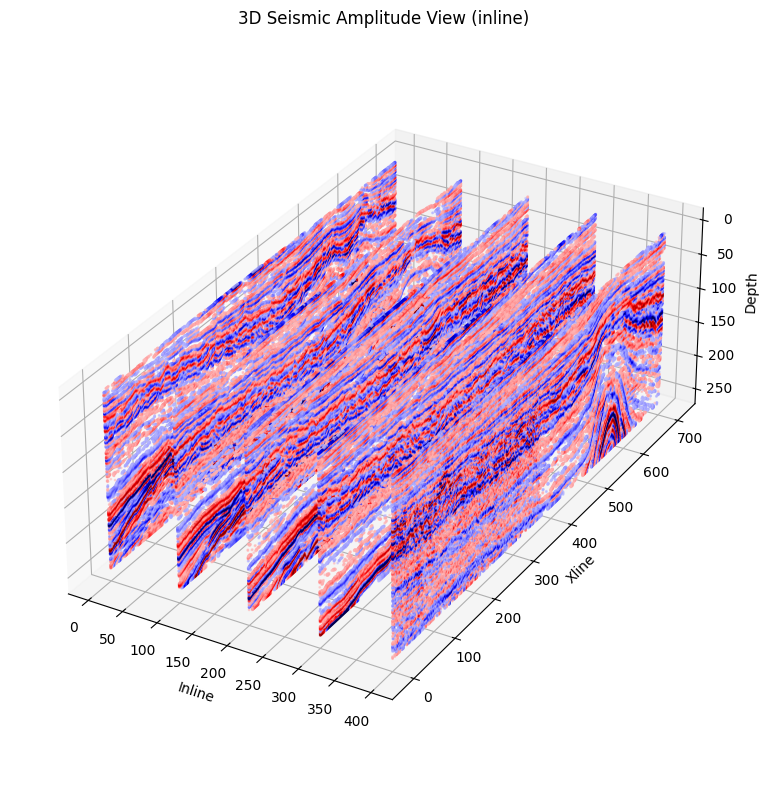

In [15]:
fig, ax = sv.plot_seismic_3d_slices(volume,
                       direction='inline',
                       step=max(n_inlines // 4, 1),
                       threshold=0.1,
                       start=0,
                       cmap='seismic')

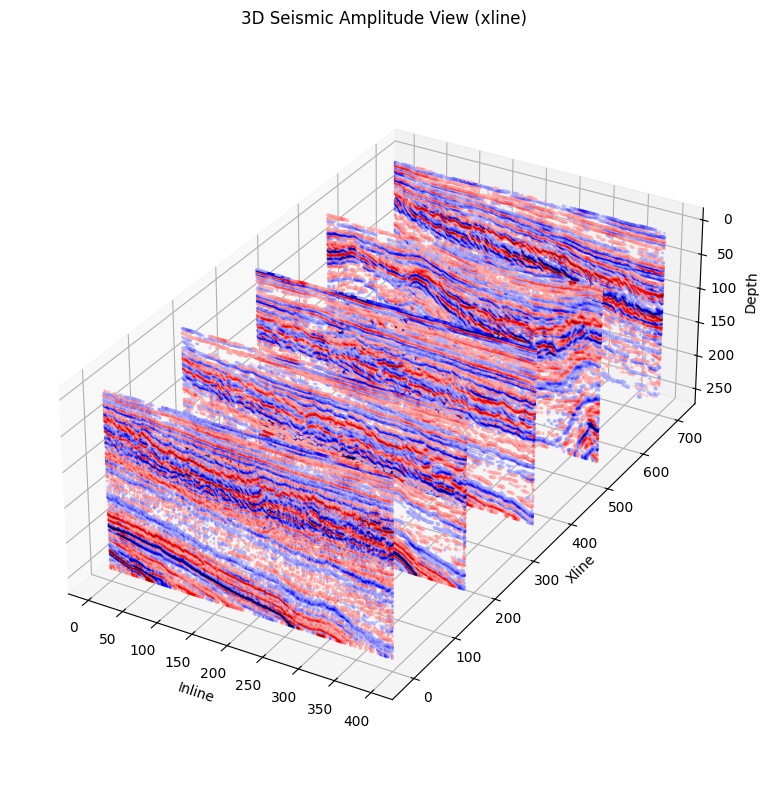

In [16]:
fig, ax = sv.plot_seismic_3d_slices(volume,
                       direction='xline',
                       step=max(n_xlines // 4, 1),
                       threshold=0.1,
                       start=0,
                       cmap='seismic')

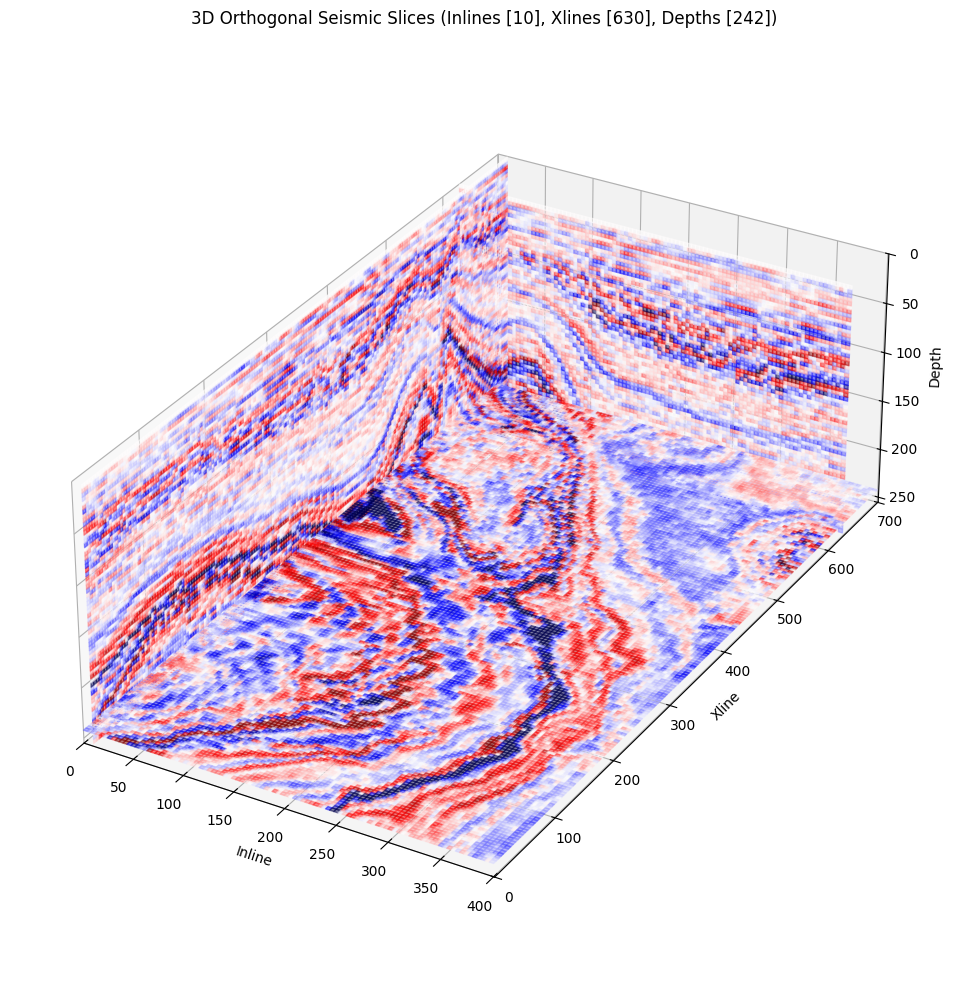

In [17]:
fig, ax = sv.plot_multiple_seismic_slices_3d(volume,
                                inline_idxs=[inline_near], xline_idxs=[xline_far],
                                depth_idxs=[depth_far], cmap='seismic', alpha=0.5, stride=4)


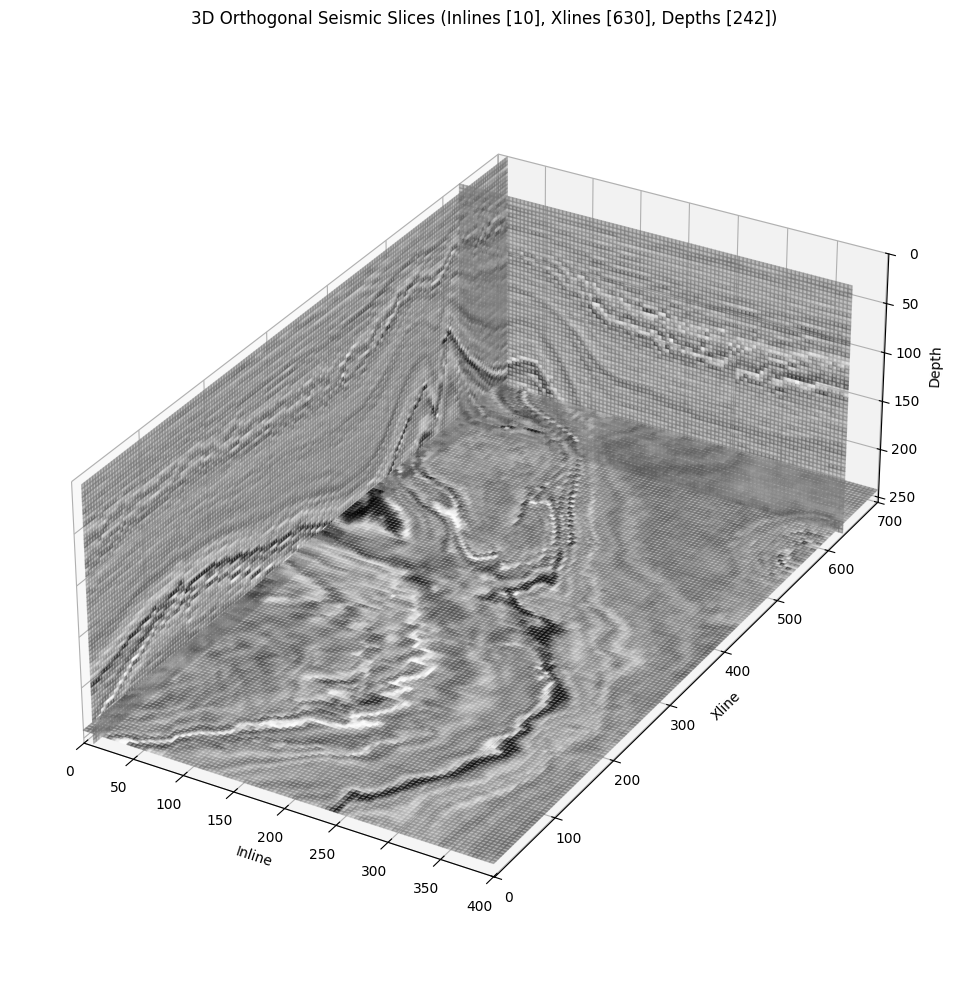

In [18]:
fig, ax = sv.plot_multiple_seismic_slices_3d(volume,
                                inline_idxs=[inline_near], xline_idxs=[xline_far],
                                depth_idxs=[depth_far], cmap='gray', alpha=0.5, stride=4)

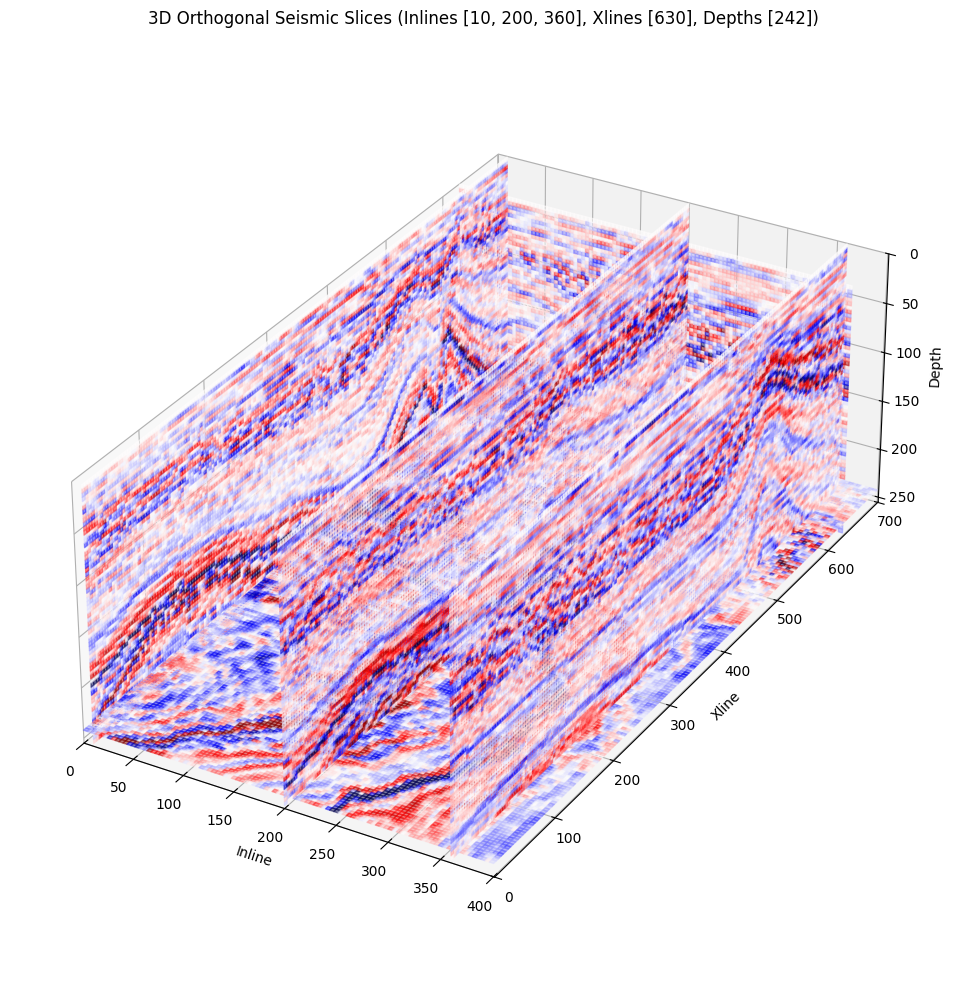

In [19]:
fig, ax = sv.plot_multiple_seismic_slices_3d(volume,
                                inline_idxs=[inline_near, n_inlines // 2, inline_far], xline_idxs=[xline_far],
                                depth_idxs=[depth_far], cmap='seismic', alpha=0.5, stride=4)
